In [103]:
import torch

In [104]:
torch.cuda.is_available()

True

In [105]:
import json
with open('./combined_labeled_sentences.json', 'r', encoding='utf-8') as f:
  dataset=json.load(f)

In [107]:
dataset_train = {x:dataset[x] for x in ['abt22_sentences.json', 'abt23_sentences.json', 'dal22_sentences.json', 'dal23_sentences.json', 'ehc22_sentences.json', 'ehc23_sentences.json', 'f22_sentences.json', 'f23_sentences.json', 'fdx22_sentences.json', 'fdx23_sentences.json', 'holx22_sentences.json', 'holx23_sentences.json', 'ogn22_sentences.json', 'ogn23_sentences.json', 'tsla22_sentences.json', 'ups22_sentences.json']}
dataset_test = {x:dataset[x] for x in ['tsla23_sentences.json',  'ups23_sentences.json', 'zbh22_sentences.json', 'zbh23_sentences.json']} 

import pandas as pd

datasetoriginal = []
for kulcs in dataset:
  for elements in dataset[kulcs]:
    datasetoriginal.append(elements)
    
    
df_train=pd.DataFrame(datasetoriginal, columns=['text', 'label']).query('label==1')

In [108]:
df_train

,text,label
24,"In addition, the substitution of generic drugs...",1
35,The Diagnostic Products segment’s products are...,1
37,Although Abbott has benefited from technologic...,1
70,Although Abbott has benefited from technologic...,1
72,Due to disruptions to the global supply chain ...,1
...,...,...
49392,"On December 27, 2023, the FDA notified us that...",1
49395,"Any adverse regulatory action, depending on it...",1
49410,"Based on that evaluation, our Chief Executive ...",1
49421,"Based on their assessment, management has conc...",1


In [109]:
import pandas as pd
import torch
from torch.utils.data import DataLoader, Dataset
from transformers import AutoModelForSequenceClassification, AutoTokenizer, Trainer, TrainingArguments, DataCollatorWithPadding

class CustomDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'text': text,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'label': torch.tensor(label, dtype=torch.float).unsqueeze(0)
        }


In [110]:
model_name = "ProsusAI/finbert"
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3)
tokenizer = AutoTokenizer.from_pretrained(model_name)
data_collator = DataCollatorWithPadding(tokenizer)

C:\Users\Jozsef\anaconda3\envs\finms\Lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.



In [111]:
train_data = CustomDataset(
    texts=df_train['text'].tolist(),
    labels=df_train['label'].tolist(),
    tokenizer=tokenizer,
    max_len=256
)

train_dataloader = DataLoader(train_data, batch_size=512, shuffle=False)

In [112]:
data_collator = DataCollatorWithPadding(tokenizer)

In [113]:
model.to('cuda')

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12,

In [114]:
model.eval()

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12,

In [115]:
def predict(model, dataloader):
    predictions = []
    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch['input_ids'].to('cuda')
            attention_mask = batch['attention_mask'].to('cuda')
            outputs = model(input_ids, attention_mask=attention_mask)
            logits = outputs.logits
            preds = torch.softmax(logits, dim=-1).cpu().numpy()
            predictions.extend(preds)
    return [x[0]-x[1] for x in predictions]

In [116]:
finbertprosus=predict(model, train_dataloader)

In [117]:
finbertprosus

[-0.24159153,
 0.7636692,
 -0.39100742,
 -0.39100742,
 -0.95262915,
 0.90089875,
 -0.24800742,
 -0.93098307,
 -0.08984831,
 -0.68376064,
 -0.7546028,
 -0.75941324,
 -0.91818434,
 0.33152908,
 -0.82351446,
 -0.8444823,
 -0.9013123,
 -0.38082767,
 -0.18380012,
 -0.9332114,
 -0.93870926,
 0.8033233,
 -0.87707496,
 -0.87888175,
 -0.93223035,
 -0.95056427,
 -0.7874637,
 -0.9440341,
 -0.9279867,
 -0.82234716,
 -0.954833,
 -0.82811046,
 -0.9545899,
 -0.9382129,
 -0.8325568,
 -0.94653654,
 -0.9286353,
 -0.94951916,
 -0.92908573,
 -0.05586383,
 -0.7861897,
 -0.91021883,
 -0.8672065,
 -0.9501185,
 -0.89172393,
 -0.8988164,
 -0.62309706,
 -0.55008656,
 -0.105888076,
 -0.88113534,
 -0.928902,
 -0.92063,
 -0.84859633,
 -0.1563975,
 -0.9146682,
 -0.8830909,
 -0.88184476,
 -0.94368774,
 -0.8736936,
 -0.63558185,
 -0.8007191,
 -0.9556582,
 -0.92854714,
 -0.89296216,
 -0.9461356,
 -0.40348676,
 -0.94903225,
 -0.9608092,
 -0.8128303,
 -0.77072984,
 -0.68314415,
 -0.7019336,
 -0.86578274,
 -0.91187865,
 

In [118]:
model_name = "yiyanghkust/finbert-tone"
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3)
tokenizer = AutoTokenizer.from_pretrained(model_name)
data_collator = DataCollatorWithPadding(tokenizer)

train_data = CustomDataset(
    texts=df_train['text'].tolist(),
    labels=df_train['label'].tolist(),
    tokenizer=tokenizer,
    max_len=256
)

train_dataloader = DataLoader(train_data, batch_size=512, shuffle=False)

data_collator = DataCollatorWithPadding(tokenizer)

model.to('cuda')
model.eval()

def predict(model, dataloader):
    predictions = []
    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch['input_ids'].to('cuda')
            attention_mask = batch['attention_mask'].to('cuda')
            outputs = model(input_ids, attention_mask=attention_mask)
            logits = outputs.logits
            preds = torch.softmax(logits, dim=-1).cpu().numpy()
            predictions.extend(preds)
    return [x[1]-x[2] for x in predictions]

In [119]:
finbertyiyanghkust = predict(model, train_dataloader)

In [120]:
finbertyiyanghkust

[-0.9889893,
 0.9271155,
 0.9009607,
 0.9009607,
 -0.99954826,
 0.9999951,
 -0.003795684,
 -0.084751174,
 -0.5896719,
 -0.8444033,
 -0.9836717,
 -0.9777493,
 -0.9983595,
 0.00042812782,
 -0.99522394,
 -0.006759103,
 -0.9983918,
 -0.008928245,
 -0.99686056,
 -0.99952435,
 -0.999973,
 -0.99784136,
 -0.9984023,
 -0.9579633,
 -0.9999883,
 -0.99996996,
 -0.6515671,
 -0.9995544,
 -0.99962217,
 -0.7518453,
 -0.9999815,
 -0.9997867,
 -0.9999946,
 -0.9709413,
 -0.98538524,
 -0.9999115,
 -0.9998034,
 -0.987338,
 -0.99757695,
 -0.01113448,
 -0.8055729,
 -0.9999977,
 -0.9985224,
 -0.9998986,
 -0.9621703,
 -0.99536115,
 -0.99804705,
 -0.987747,
 -0.0031329168,
 -0.97030026,
 -0.99688,
 -0.9964261,
 -0.99993205,
 -0.026582371,
 -0.9999461,
 -0.99997514,
 -0.99498904,
 -0.9999974,
 -0.9983139,
 -0.9240544,
 -0.99998343,
 -0.9999974,
 -0.9999855,
 -0.89601386,
 -0.9999899,
 -0.18582043,
 -0.9999863,
 -0.99983615,
 -0.99998426,
 -0.68458104,
 -0.975251,
 -0.99882585,
 -0.99990374,
 -0.99977434,
 -0.001

In [121]:
from finvader import finvader

In [122]:
finvader_score_henry = lambda text:  finvader(text, 
                  use_sentibignomics = False, 
                  use_henry = True, 
                  indicator = 'compound')

finvader_score_sb = lambda text:  finvader(text, 
                  use_sentibignomics = True, 
                  use_henry = False, 
                  indicator = 'compound')

finvader_score_both = lambda text:  finvader(text, 
                  use_sentibignomics = True, 
                  use_henry = True, 
                  indicator = 'compound')

In [123]:
df_results=df_train.copy()

In [124]:
df_results['finbertprosus']=finbertprosus
df_results['finbertyiyang']=finbertyiyanghkust

In [125]:
%%time
df_results['finvaderhenry']=df_results.text.apply(finvader_score_henry)
df_results['finvadersb']=df_results.text.apply(finvader_score_sb)
df_results['finvaderboth']=df_results.text.apply(finvader_score_both)

CPU times: total: 3min 23s
Wall time: 3min 54s


In [126]:
with open('./combined_labeled_sentences.json', 'r', encoding='utf-8') as f:
  datasetoriginal=json.load(f)

In [127]:
docids=[]
for docid in datasetoriginal:
    temp=[docid.replace('.json','')]*len(list(filter(lambda x: x[1]==1, datasetoriginal[docid])))
    docids+=temp

In [128]:
df_results['docids']=docids

In [134]:
df_results.drop(['label', 'text', 'docids'], axis=1).corr().style.background_gradient(cmap='Blues')

,finbertprosus,finbertyiyang,finvaderhenry,finvadersb,finvaderboth
finbertprosus,1.000000,0.763317,0.485897,0.258547,0.468492
finbertyiyang,0.763317,1.000000,0.461087,0.249156,0.426508
finvaderhenry,0.485897,0.461087,1.000000,0.537589,0.762308
finvadersb,0.258547,0.249156,0.537589,1.000000,0.695300
finvaderboth,0.468492,0.426508,0.762308,0.695300,1.000000


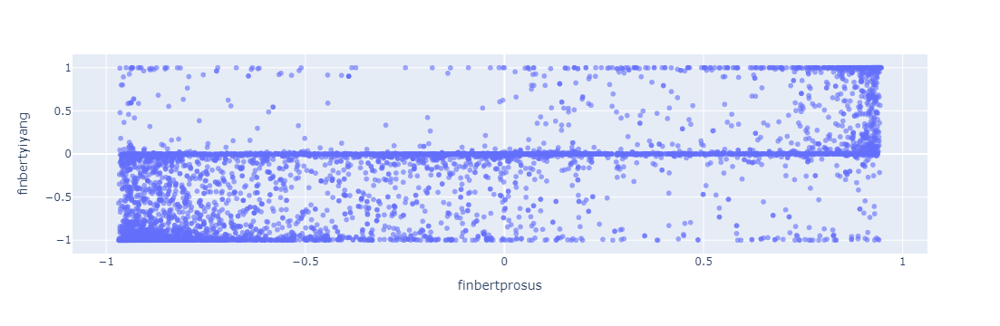

In [144]:
px.scatter(df_results, x='finbertprosus', y='finbertyiyang', hover_data='text', opacity=0.6)

futó mozgó átlag / regressziós görbét tegyünk az ábrára + plusz átló

**prosus pos (0.9 +), yiyang neg (-0.9 -):**

Purchased transportation increased 18% in 2022 primarily due to the challenging labor market resulting in higher utilization of third-party service providers and increased rates, as well as higher fuel surcharges.

Organon has been taking steps to increase its sales in emerging markets; however, Organon's efforts to expand sales in these markets may not succeed.

**prosus neg (-0.9 -), yiyang pos (0.9 +):**

In 2021, the impact of foreign exchange favorably impacted net sales and unfavorably impacted operating earnings.

Forwarding operating expenses decreased $1.1 billion, driven by a reduction in purchased transportation costs.

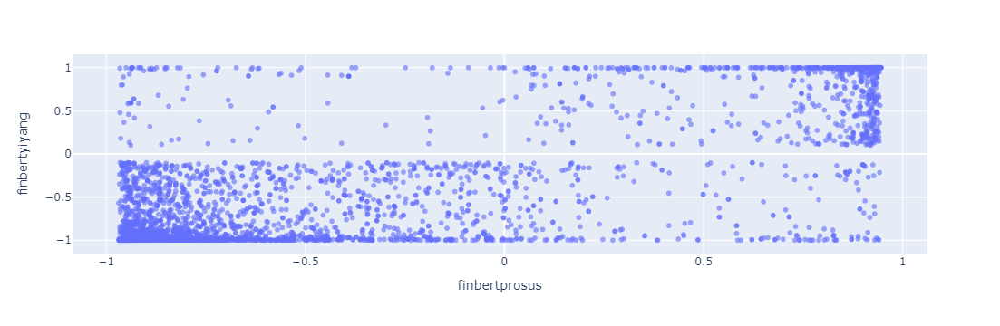

In [137]:
px.scatter(df_results.query('finbertyiyang>0.1 or finbertyiyang<-0.1'), x='finbertprosus', y='finbertyiyang', opacity=0.6)

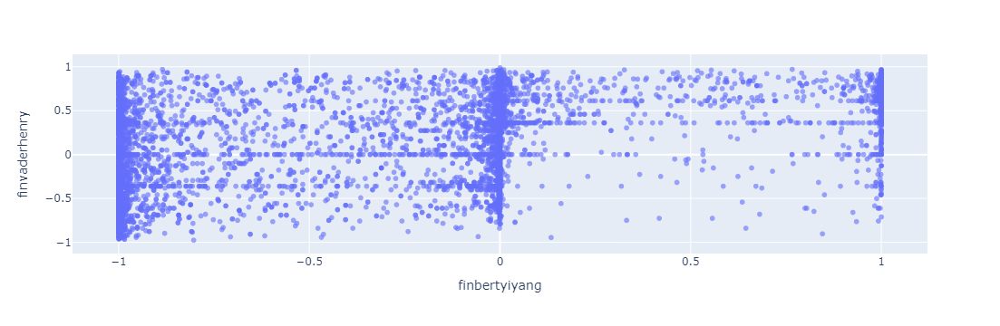

In [151]:
px.scatter(df_results, x='finbertyiyang', y='finvaderhenry', hover_data='text', opacity=0.6)

$$\text{VADER}=\frac{s}{\sqrt{s^2+\alpha}}$$

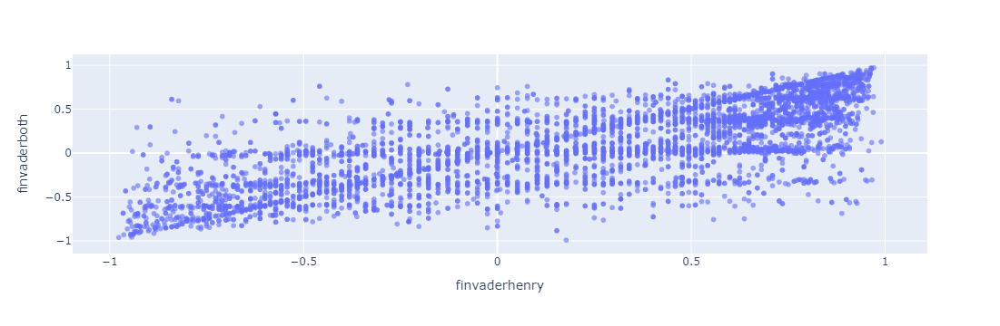

In [233]:
px.scatter(df_results, x='finvaderhenry', y='finvaderboth', hover_data='text', opacity=0.6)

In [154]:
'abt22_sentences'.split('2')

['abt', '', '_sentences']

In [157]:
df_results['company']=df_results['docids'].apply(lambda x: x.split('2')[0])
df_results['year']=df_results['docids'].apply(lambda x: 2000+int(x.split('_')[0][-2:]))

In [174]:
df_results['docids']=df_results['docids'].apply(lambda x: x.split('_')[0])

In [175]:
df_results

,text,label,finbertprosus,finbertyiyang,finvaderhenry,finvadersb,finvaderboth,docids,company,year
24,"In addition, the substitution of generic drugs...",1,-0.241592,-0.988989,0.2263,-0.2709,0.0887,abt22,abt,2022
35,The Diagnostic Products segment’s products are...,1,0.763669,0.927115,0.7579,0.4215,0.4215,abt22,abt,2022
37,Although Abbott has benefited from technologic...,1,-0.391007,0.900961,0.7579,0.6237,0.7629,abt22,abt,2022
70,Although Abbott has benefited from technologic...,1,-0.391007,0.900961,0.7579,0.6237,0.7629,abt22,abt,2022
72,Due to disruptions to the global supply chain ...,1,-0.952629,-0.999548,-0.6486,-0.6457,-0.6457,abt22,abt,2022
...,...,...,...,...,...,...,...,...,...,...
49392,"On December 27, 2023, the FDA notified us that...",1,-0.037853,-0.985409,-0.2023,-0.2023,-0.2023,zbh23,zbh,2023
49395,"Any adverse regulatory action, depending on it...",1,-0.754656,-0.811589,-0.5719,0.4460,0.4460,zbh23,zbh,2023
49410,"Based on that evaluation, our Chief Executive ...",1,0.691772,0.044371,0.6705,0.3591,0.3591,zbh23,zbh,2023
49421,"Based on their assessment, management has conc...",1,0.383214,0.006783,0.4767,0.0207,0.0207,zbh23,zbh,2023


In [176]:
df_results_tall=pd.melt(df_results, id_vars=['company', 'year', 'text', 'docids'],value_vars=['finbertprosus', 'finbertyiyang', 'finvaderhenry', 'finvadersb', 'finvaderboth'])

In [177]:
df_results_tall

,company,year,text,docids,variable,value
0,abt,2022,"In addition, the substitution of generic drugs...",abt22,finbertprosus,-0.241592
1,abt,2022,The Diagnostic Products segment’s products are...,abt22,finbertprosus,0.763669
2,abt,2022,Although Abbott has benefited from technologic...,abt22,finbertprosus,-0.391007
3,abt,2022,Although Abbott has benefited from technologic...,abt22,finbertprosus,-0.391007
4,abt,2022,Due to disruptions to the global supply chain ...,abt22,finbertprosus,-0.952629
...,...,...,...,...,...,...
49635,zbh,2023,"On December 27, 2023, the FDA notified us that...",zbh23,finvaderboth,-0.202300
49636,zbh,2023,"Any adverse regulatory action, depending on it...",zbh23,finvaderboth,0.446000
49637,zbh,2023,"Based on that evaluation, our Chief Executive ...",zbh23,finvaderboth,0.359100
49638,zbh,2023,"Based on their assessment, management has conc...",zbh23,finvaderboth,0.020700


In [178]:
df_results_tall

,company,year,text,docids,variable,value
0,abt,2022,"In addition, the substitution of generic drugs...",abt22,finbertprosus,-0.241592
1,abt,2022,The Diagnostic Products segment’s products are...,abt22,finbertprosus,0.763669
2,abt,2022,Although Abbott has benefited from technologic...,abt22,finbertprosus,-0.391007
3,abt,2022,Although Abbott has benefited from technologic...,abt22,finbertprosus,-0.391007
4,abt,2022,Due to disruptions to the global supply chain ...,abt22,finbertprosus,-0.952629
...,...,...,...,...,...,...
49635,zbh,2023,"On December 27, 2023, the FDA notified us that...",zbh23,finvaderboth,-0.202300
49636,zbh,2023,"Any adverse regulatory action, depending on it...",zbh23,finvaderboth,0.446000
49637,zbh,2023,"Based on that evaluation, our Chief Executive ...",zbh23,finvaderboth,0.359100
49638,zbh,2023,"Based on their assessment, management has conc...",zbh23,finvaderboth,0.020700


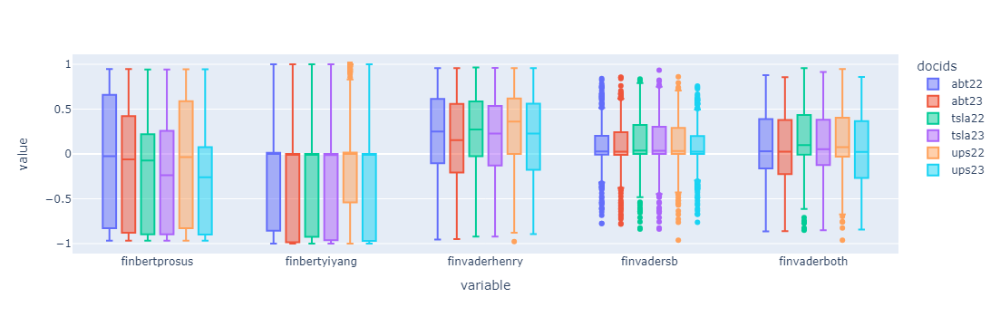

In [180]:
querydocids=['abt22', 'abt23', 'tsla22', 'tsla23', 'ups22', 'ups23']
px.box(df_results_tall.query('docids in @querydocids'), x='variable', y='value', color='docids')

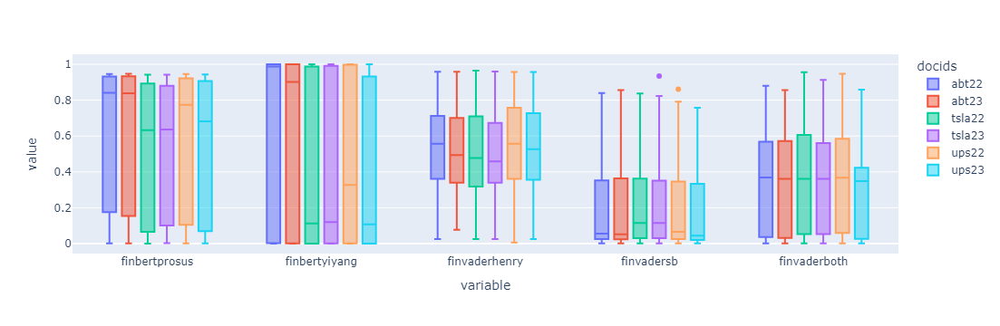

In [181]:
querydocids=['abt22', 'abt23', 'tsla22', 'tsla23', 'ups22', 'ups23']
px.box(df_results_tall.query('docids in @querydocids and value > 0'), x='variable', y='value', color='docids')

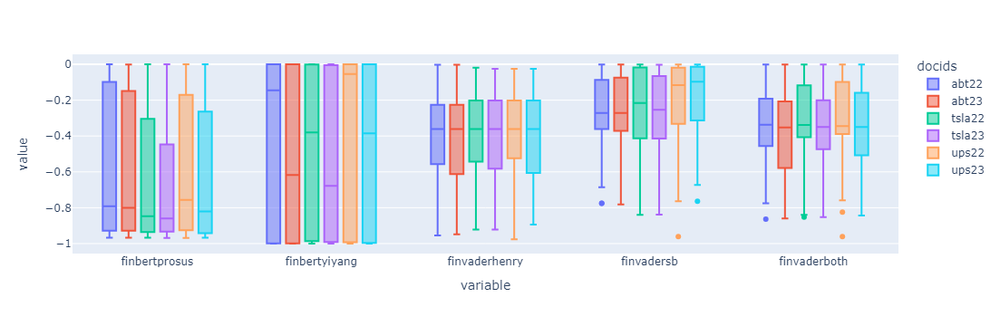

In [182]:
querydocids=['abt22', 'abt23', 'tsla22', 'tsla23', 'ups22', 'ups23']
px.box(df_results_tall.query('docids in @querydocids and value < 0'), x='variable', y='value', color='docids')

In [189]:
print('Ratio of positive scores:')
df_results_tall.groupby('variable').value.apply(lambda x: (x>0).mean())

Ratio of positive scores:


variable
finbertprosus    0.366741
finbertyiyang    0.270246
finvaderboth     0.634267
finvaderhenry    0.567889
finvadersb       0.678284
Name: value, dtype: float64

In [191]:
df_results_tall.groupby('variable').value.apply(lambda x: x.sum()/20)

variable
finbertprosus   -105.742520
finbertyiyang   -113.209683
finvaderboth      43.666580
finvaderhenry     82.119515
finvadersb        28.163710
Name: value, dtype: float64

In [303]:
import numpy

In [322]:
sentencevader = lambda x, alpha: numpy.mean(x)

In [323]:
df_results_tall

,company,year,text,docids,variable,value
0,abt,2022,"In addition, the substitution of generic drugs...",abt22,finbertprosus,-0.241592
1,abt,2022,The Diagnostic Products segment’s products are...,abt22,finbertprosus,0.763669
2,abt,2022,Although Abbott has benefited from technologic...,abt22,finbertprosus,-0.391007
3,abt,2022,Although Abbott has benefited from technologic...,abt22,finbertprosus,-0.391007
4,abt,2022,Due to disruptions to the global supply chain ...,abt22,finbertprosus,-0.952629
...,...,...,...,...,...,...
49635,zbh,2023,"On December 27, 2023, the FDA notified us that...",zbh23,finvaderboth,-0.202300
49636,zbh,2023,"Any adverse regulatory action, depending on it...",zbh23,finvaderboth,0.446000
49637,zbh,2023,"Based on that evaluation, our Chief Executive ...",zbh23,finvaderboth,0.359100
49638,zbh,2023,"Based on their assessment, management has conc...",zbh23,finvaderboth,0.020700


In [324]:
alpha_dictionary={'finbertprosus':-105.742520,
'finbertyiyang':-113.209683,
'finvaderboth':43.666580,
'finvaderhenry':82.119515,
'finvadersb':28.163710} 

results=[]
for docid in df_results_tall.docids.unique():
    print(docid)
    for method in df_results_tall.variable.unique():
        print(method)
        print(sentencevader(df_results_tall.query('docids == @docid and variable==@method').value.values, alpha_dictionary[method]))
        results.append([docid, method, sentencevader(df_results_tall.query('docids == @docid and variable==@method').value.values, alpha_dictionary[method])])
    print('\n\n\n')

abt22
finbertprosus
-0.06815908459547736
finbertyiyang
-0.06911831856144951
finvaderhenry
0.19029566395663955
finvadersb
0.06321978319783197
finvaderboth
0.11211517615176153




abt23
finbertprosus
-0.1362791012336568
finbertyiyang
-0.17466582017251514
finvaderhenry
0.14038157181571817
finvadersb
0.056583739837398374
finvaderboth
0.07420813008130082




dal22
finbertprosus
-0.03436061901086611
finbertyiyang
-0.08678884488703409
finvaderhenry
0.19784420803782504
finvadersb
0.04074326241134752
finvaderboth
0.12289739952718677




dal23
finbertprosus
-0.15063732029071877
finbertyiyang
-0.14927107104027867
finvaderhenry
0.18706771428571428
finvadersb
0.047605142857142846
finvaderboth
0.10511657142857143




ehc22
finbertprosus
-0.22420295080031205
finbertyiyang
-0.24747072466774303
finvaderhenry
0.11057065217391304
finvadersb
0.02771847826086957
finvaderboth
0.055708385093167695




ehc23
finbertprosus
-0.29642362766714003
finbertyiyang
-0.30031887894147835
finvaderhenry
0.0918004418262150

In [325]:
dfscoreresults=pd.DataFrame(results, columns=['docids','method','value'])

In [326]:
dfscoreresults

,docids,method,value
0,abt22,finbertprosus,-0.068159
1,abt22,finbertyiyang,-0.069118
2,abt22,finvaderhenry,0.190296
3,abt22,finvadersb,0.063220
4,abt22,finvaderboth,0.112115
...,...,...,...
95,zbh23,finbertprosus,-0.233464
96,zbh23,finbertyiyang,-0.204889
97,zbh23,finvaderhenry,0.099434
98,zbh23,finvadersb,0.032607


In [327]:
dfscorequeried

,docids,method,value
50,holx22,finbertprosus,-0.998939
55,holx23,finbertprosus,-0.998917
51,holx22,finbertyiyang,-0.999159
56,holx23,finbertyiyang,-0.999055
54,holx22,finvaderboth,0.927901
59,holx23,finvaderboth,0.988852
52,holx22,finvaderhenry,0.987902
57,holx23,finvaderhenry,0.997025
53,holx22,finvadersb,0.950820
58,holx23,finvadersb,0.972896


Text(0.5, 1.0, 'Abbott Delta Sentiment')

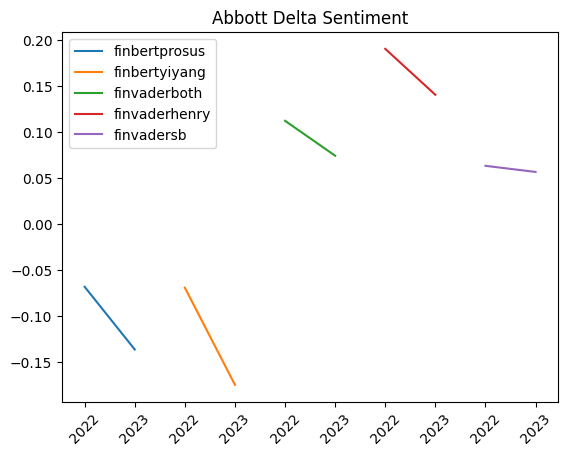

In [328]:
import matplotlib.pyplot as plt
docidsquery=['abt22', 'abt23']
dfscorequeried=dfscoreresults.query('docids in @docidsquery').sort_values(['method', 'docids'])
plt.plot([1,2],dfscorequeried.value.iloc[0:2], label=dfscorequeried.method.iloc[0])
plt.plot([3,4],dfscorequeried.value.iloc[2:4], label=dfscorequeried.method.iloc[2])
plt.plot([5,6],dfscorequeried.value.iloc[4:6], label=dfscorequeried.method.iloc[4])
plt.plot([7,8],dfscorequeried.value.iloc[6:8], label=dfscorequeried.method.iloc[6])
plt.plot([9,10],dfscorequeried.value.iloc[8:10], label=dfscorequeried.method.iloc[8])
plt.xticks([1,2,3,4,5,6,7,8,9,10],labels=[2022, 2023]*5, rotation=45)
plt.legend()
plt.title('Abbott Delta Sentiment')

Text(0.5, 1.0, 'UPS Delta Sentiment Plot')

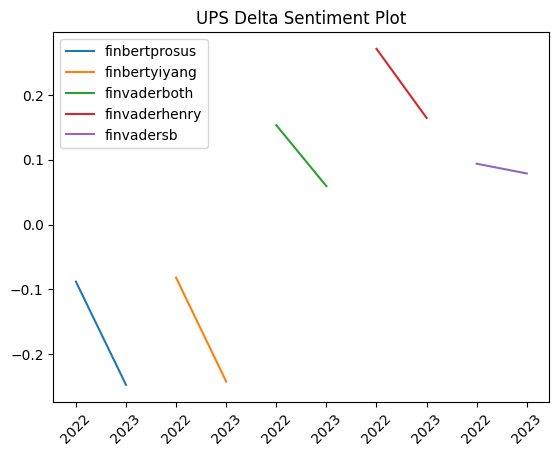

In [329]:
import matplotlib.pyplot as plt
docidsquery=['ups22', 'ups23']
dfscorequeried=dfscoreresults.query('docids in @docidsquery').sort_values(['method', 'docids'])
plt.plot([1,2],dfscorequeried.value.iloc[0:2], label=dfscorequeried.method.iloc[0])
plt.plot([3,4],dfscorequeried.value.iloc[2:4], label=dfscorequeried.method.iloc[2])
plt.plot([5,6],dfscorequeried.value.iloc[4:6], label=dfscorequeried.method.iloc[4])
plt.plot([7,8],dfscorequeried.value.iloc[6:8], label=dfscorequeried.method.iloc[6])
plt.plot([9,10],dfscorequeried.value.iloc[8:10], label=dfscorequeried.method.iloc[8])
plt.xticks([1,2,3,4,5,6,7,8,9,10],labels=[2022, 2023]*5, rotation=45)
plt.legend()
plt.title('UPS Delta Sentiment Plot')

Text(0.5, 1.0, 'Hologic Delta Sentiment Plot')

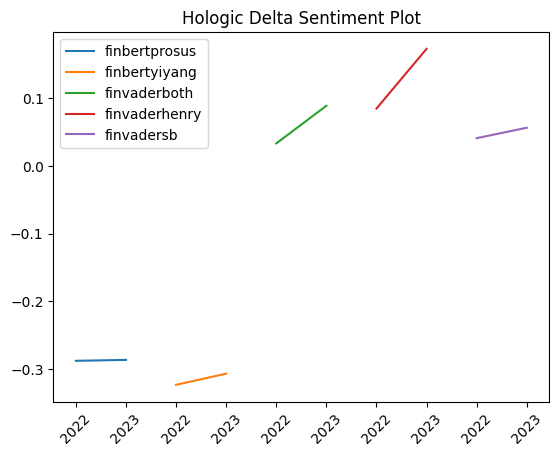

In [330]:
import matplotlib.pyplot as plt
docidsquery=['holx22', 'holx23']
dfscorequeried=dfscoreresults.query('docids in @docidsquery').sort_values(['method', 'docids'])
plt.plot([1,2],dfscorequeried.value.iloc[0:2], label=dfscorequeried.method.iloc[0])
plt.plot([3,4],dfscorequeried.value.iloc[2:4], label=dfscorequeried.method.iloc[2])
plt.plot([5,6],dfscorequeried.value.iloc[4:6], label=dfscorequeried.method.iloc[4])
plt.plot([7,8],dfscorequeried.value.iloc[6:8], label=dfscorequeried.method.iloc[6])
plt.plot([9,10],dfscorequeried.value.iloc[8:10], label=dfscorequeried.method.iloc[8])
plt.xticks([1,2,3,4,5,6,7,8,9,10],labels=[2022, 2023]*5, rotation=45)
plt.legend()
plt.title('Hologic Delta Sentiment Plot')

ötlet: 10% max és 10% min átlagolása